# Image Processing - Trump Images

This notebook loads 3 images from a GitHub repository and applies various image processing techniques:

- Resize
- Grayscale
- Blur
- Edge Detection
- Crop
- Rotation
- Brightness/Contrast Adjustment

Each processed image will be displayed inline.

In [3]:
# Run this only once if you don't have the libraries installed
!pip install opencv-python pillow matplotlib

In [4]:
pip install pandas IPython

Note: you may need to restart the kernel to use updated packages.


In [6]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import requests
from io import BytesIO

## Load Images from GitHub

These are the images we'll work with, hosted on GitHub:
- Trumcatx.png
- cat_in_suit.png
- trumpcat.png

In [10]:
image_urls = {
    "Trumcatx.png": "https://raw.githubusercontent.com/AlberteVallentin/Dat-BI-Gruppe7/main/MP1/Dataset/photos/Trumcatx.png",
    "cat_in_suit.png": "https://raw.githubusercontent.com/AlberteVallentin/Dat-BI-Gruppe7/main/MP1/Dataset/photos/cat_in_suit.png",
    "trumpcat.png": "https://raw.githubusercontent.com/AlberteVallentin/Dat-BI-Gruppe7/main/MP1/Dataset/photos/trumpcat.png"
}

In [12]:
# Helper to show images in grid
def show_images(images, titles, cols=3):
    rows = (len(images) + cols - 1) // cols
    plt.figure(figsize=(4*cols, 4*rows))
    for i, (img, title) in enumerate(zip(images, titles)):
        plt.subplot(rows, cols, i+1)
        if len(img.shape) == 2:  # grayscale
            plt.imshow(img, cmap='gray')
        else:
            plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        plt.title(title)
        plt.axis('off')
    plt.tight_layout()
    plt.show()

## Process Images - styles

We will:
1. Load each image
2. Apply transformations
3. Display results in a grid


Processing: Trumcatx.png


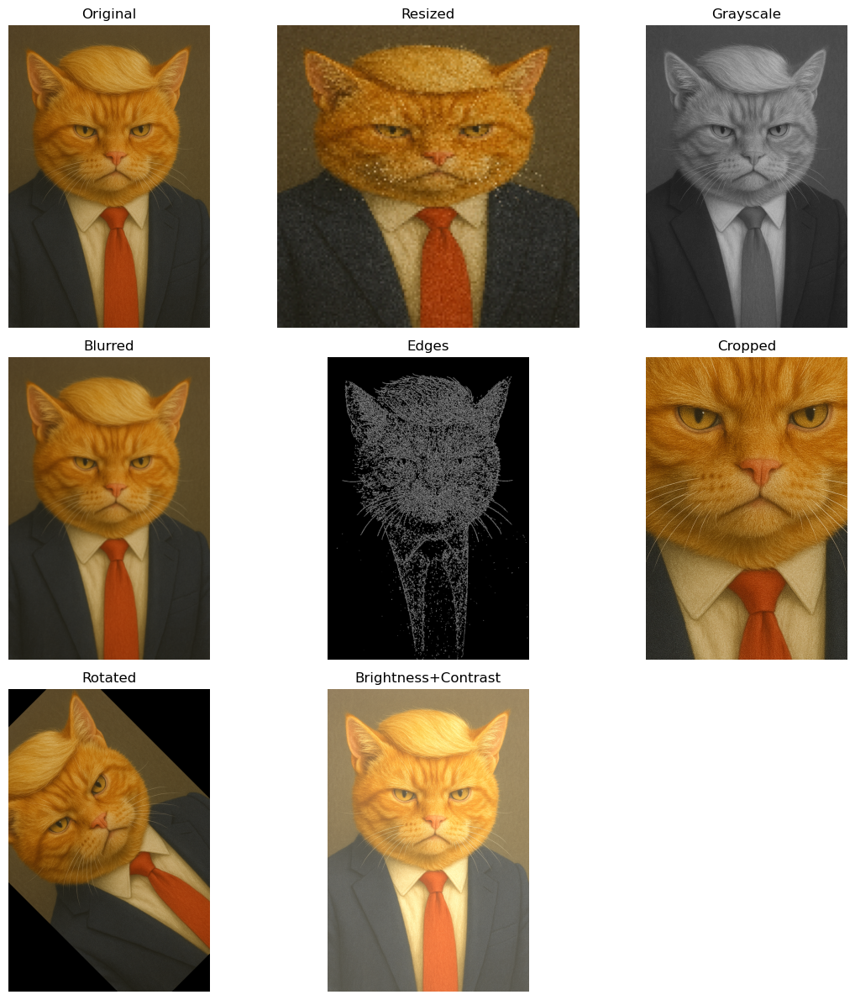


Processing: cat_in_suit.png


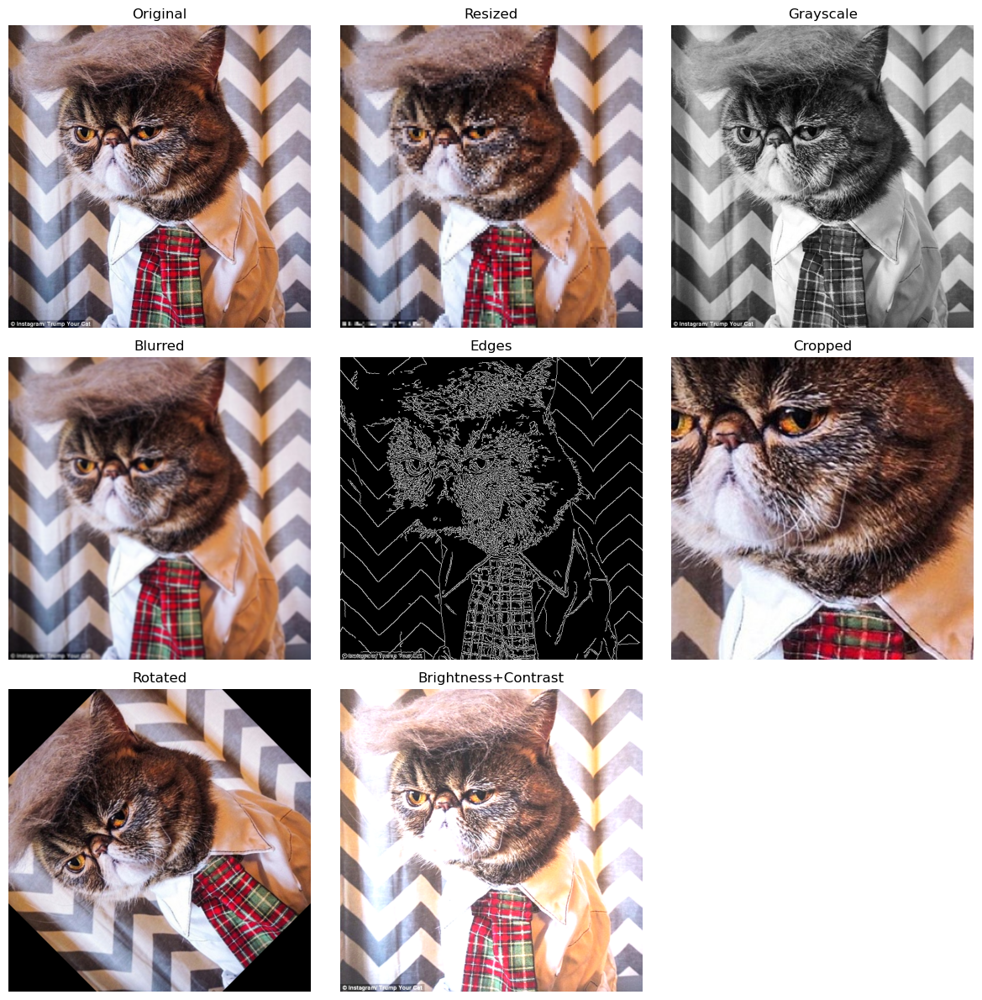


Processing: trumpcat.png


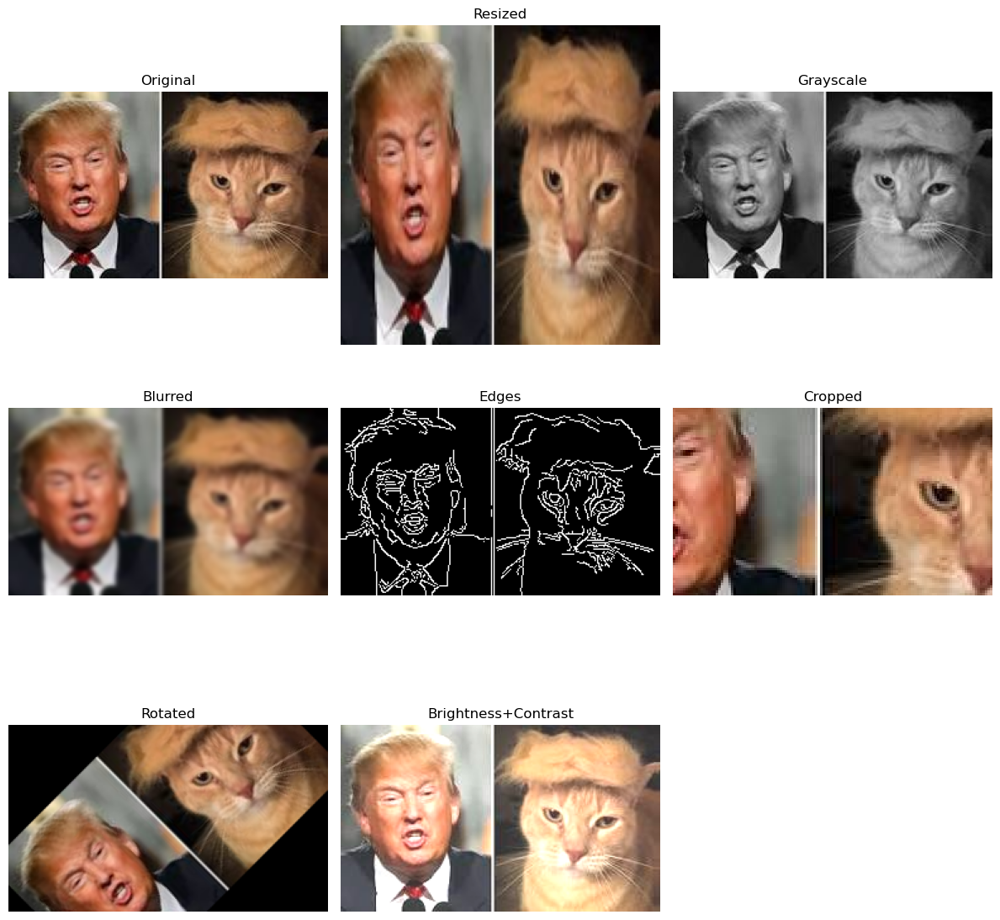

In [15]:
# Loop over each image and apply transformations
for name, url in image_urls.items():
    print(f"\nProcessing: {name}")

    # Load the image from GitHub
    response = requests.get(url)
    image = Image.open(BytesIO(response.content)).convert("RGB")
    img_cv = cv2.cvtColor(np.array(image), cv2.COLOR_RGB2BGR)

    # Original image
    original = img_cv.copy()

    # Resize image to 150x150
    resized = cv2.resize(original, (150, 150))

    # Convert to Grayscale
    gray = cv2.cvtColor(original, cv2.COLOR_BGR2GRAY)

    # Apply Gaussian Blur
    blurred = cv2.GaussianBlur(original, (9, 9), 0)

    # Edge Detection using Canny
    edges = cv2.Canny(original, 100, 200)

    # Crop the central region
    h, w = original.shape[:2]
    cropped = original[h//4:3*h//4, w//4:3*w//4]

    # Rotate the image 45 degrees
    center = (w//2, h//2)
    M = cv2.getRotationMatrix2D(center, 45, 1.0)
    rotated = cv2.warpAffine(original, M, (w, h))

    # Adjust Brightness and Contrast
    bright_contrast = cv2.convertScaleAbs(original, alpha=1.2, beta=50)

    # Display all transformations
    show_images(
        [original, resized, gray, blurred, edges, cropped, rotated, bright_contrast],
        ["Original", "Resized", "Grayscale", "Blurred", "Edges", "Cropped", "Rotated", "Brightness+Contrast"]
    )


# Display images in dataframe

In [18]:
import pandas as pd
from IPython.display import HTML
import base64
from PIL import Image
import io

,Image Name,Original,Grayscale,Resized
0,Trumcatx.png,,,
1,cat_in_suit.png,,,
2,trumpcat.png,,,

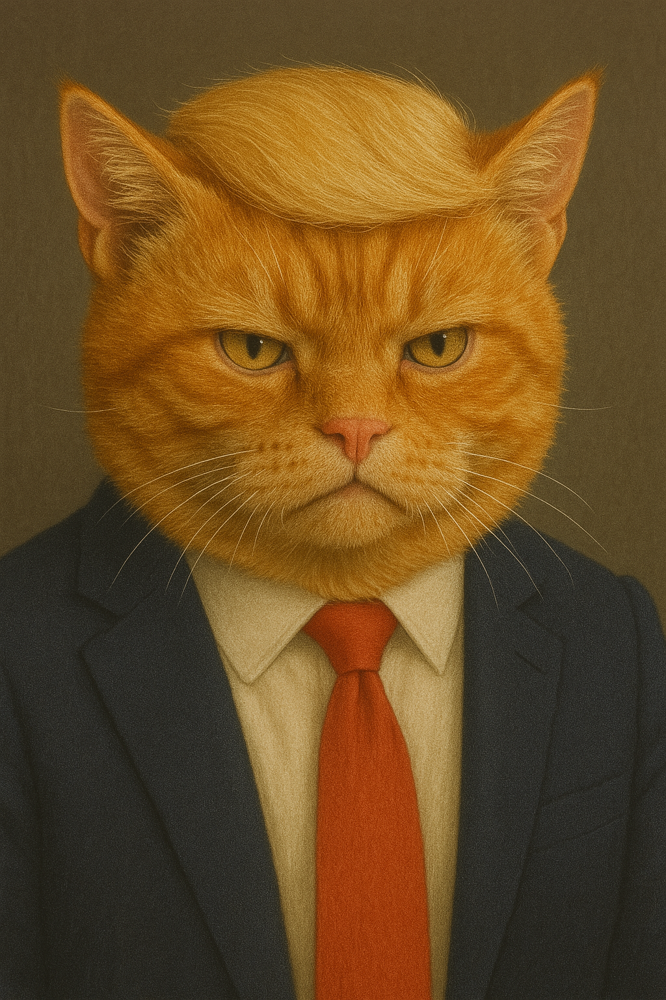
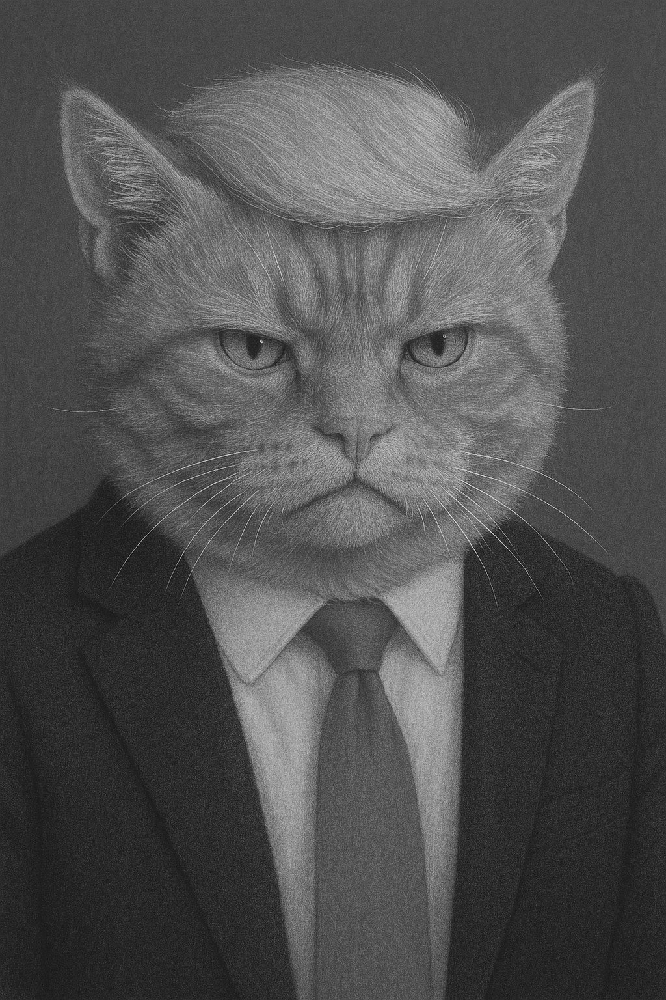
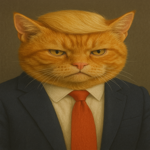
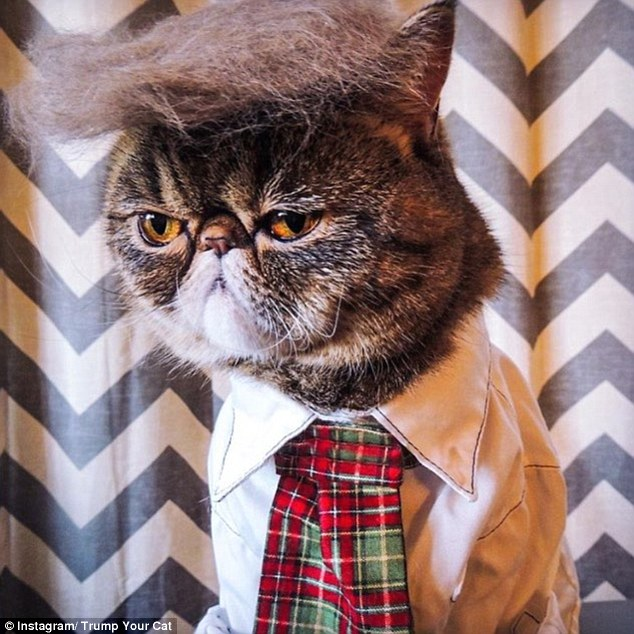
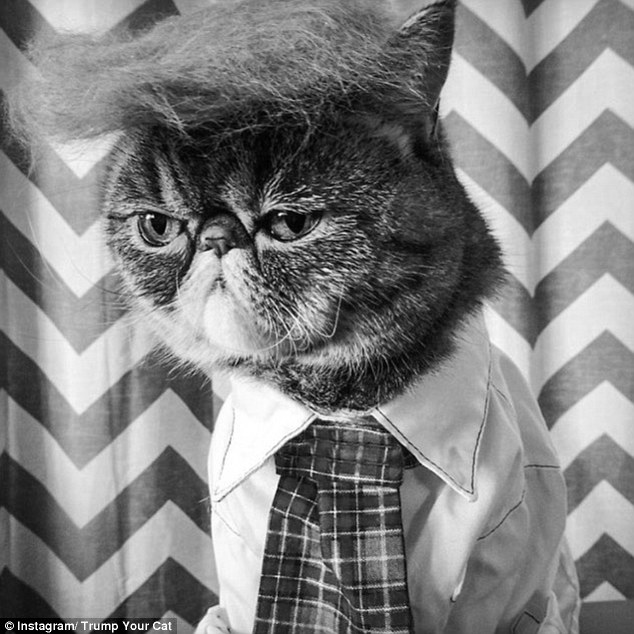
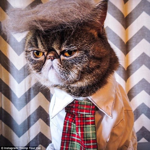
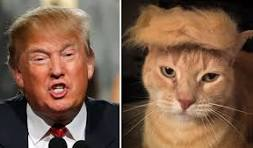
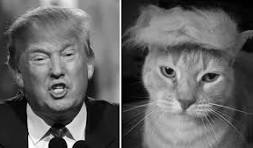
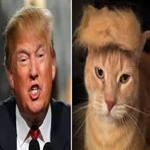

In [20]:
# Helper function to convert image to base64 string for inline display
def pil_image_to_base64(img):
    buffered = io.BytesIO()
    img.save(buffered, format="PNG")
    img_str = base64.b64encode(buffered.getvalue()).decode()
    return f'<img src="data:image/png;base64,{img_str}" width="150"/>'

# Create a list to hold rows of image and label
rows = []

# Process and collect images
for name, url in image_urls.items():
    response = requests.get(url)
    image = Image.open(BytesIO(response.content)).convert("RGB")

    # Example processing
    grayscale = image.convert("L")
    resized = image.resize((150, 150))

    # Add original and processed versions to the DataFrame
    rows.append({
        "Image Name": name,
        "Original": pil_image_to_base64(image),
        "Grayscale": pil_image_to_base64(grayscale.convert("RGB")),
        "Resized": pil_image_to_base64(resized)
    })

# Create DataFrame
df = pd.DataFrame(rows)

# Display DataFrame with HTML images
HTML(df.to_html(escape=False))

# Turn images into numbers

In [22]:
import numpy as np

# New list for numerical data
numerical_rows = []

for name, url in image_urls.items():
    response = requests.get(url)
    image = Image.open(BytesIO(response.content)).convert("RGB")

    # Convert to numpy array
    img_np = np.array(image)

    # Calculate statistics
    mean_pixel = img_np.mean()
    std_pixel = img_np.std()
    width, height = image.size
    pixel_count = width * height

    # Separate channel means
    r_mean = img_np[:, :, 0].mean()
    g_mean = img_np[:, :, 1].mean()
    b_mean = img_np[:, :, 2].mean()

    numerical_rows.append({
        "Image Name": name,
        "Width": width,
        "Height": height,
        "Pixel Count": pixel_count,
        "Mean Brightness": mean_pixel,
        "Std Brightness": std_pixel,
        "R Mean": r_mean,
        "G Mean": g_mean,
        "B Mean": b_mean
    })

# Create a DataFrame with numerical features
df_numeric = pd.DataFrame(numerical_rows)

# Show the DataFrame
df_numeric.head()


,Image Name,Width,Height,Pixel Count,Mean Brightness,Std Brightness,R Mean,G Mean,B Mean
0,Trumcatx.png,1024,1536,1572864,72.769945,49.545557,106.868767,76.461316,34.979751
1,cat_in_suit.png,634,634,401956,129.941233,67.914913,146.263399,121.914302,121.645999
2,trumpcat.png,253,148,37444,95.890681,62.055193,122.821253,92.248424,72.602366


# Data cleaning

## Step 1: Check for missing values

In [27]:
# Check for missing (null) values in the numeric DataFrame
df_numeric.isnull().sum()

#We don't expect any missing values from images

Image Name         0
Width              0
Height             0
Pixel Count        0
Mean Brightness    0
Std Brightness     0
R Mean             0
G Mean             0
B Mean             0
dtype: int64

## Step 2: Simulate and handle outliers

In [30]:
import numpy as np

# Step 1: Simulate an outlier in 'Mean Brightness'
# Let's assume that something went wrong during image processing
# and we accidentally got a brightness value that's way too high.
df_numeric.loc[0, 'Mean Brightness'] = 9999  # Inject artificial outlier

# Display the DataFrame with the outlier
print("📛 DataFrame with artificial outlier:")
display(df_numeric)

# Step 2: Mark brightness values above 255 as NaN
# Pixel values in images should not exceed 255, so we treat anything above that as invalid.
df_numeric['Mean Brightness'] = df_numeric['Mean Brightness'].apply(
    lambda x: np.nan if x > 255 else x
)

# Step 3: Fill missing values with the mean of the valid (non-outlier) brightness values
mean_brightness_clean = df_numeric['Mean Brightness'].mean()
df_numeric['Mean Brightness'] = df_numeric['Mean Brightness'].fillna(mean_brightness_clean)

# Final cleaned DataFrame
print("✅ Cleaned DataFrame after removing outlier and filling with column mean:")
display(df_numeric)



📛 DataFrame with artificial outlier:


,Image Name,Width,Height,Pixel Count,Mean Brightness,Std Brightness,R Mean,G Mean,B Mean
0,Trumcatx.png,1024,1536,1572864,9999.000000,49.545557,106.868767,76.461316,34.979751
1,cat_in_suit.png,634,634,401956,129.941233,67.914913,146.263399,121.914302,121.645999
2,trumpcat.png,253,148,37444,95.890681,62.055193,122.821253,92.248424,72.602366


✅ Cleaned DataFrame after removing outlier and filling with column mean:


,Image Name,Width,Height,Pixel Count,Mean Brightness,Std Brightness,R Mean,G Mean,B Mean
0,Trumcatx.png,1024,1536,1572864,112.915957,49.545557,106.868767,76.461316,34.979751
1,cat_in_suit.png,634,634,401956,129.941233,67.914913,146.263399,121.914302,121.645999
2,trumpcat.png,253,148,37444,95.890681,62.055193,122.821253,92.248424,72.602366


# Data visuals

Image Name,Thumbnail,Grayscale Avg Bin,Mean Brightness,Std Dev,R Mean,G Mean,B Mean,Width,Height
Trumcatx.png,,0.80,72.77,49.55,106.87,76.46,34.98,1024,1536
cat_in_suit.png,,1.52,129.94,67.91,146.26,121.91,121.65,634,634
trumpcat.png,,1.08,95.89,62.06,122.82,92.25,72.60,253,148

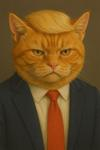
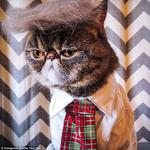
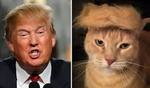

In [34]:

import os
import base64
import random
import requests
import pandas as pd
import numpy as np
from PIL import Image
from io import BytesIO
from IPython.display import HTML

# Optional: ignore truncation of long strings
pd.set_option('display.max_colwidth', None)

# --- Step 1: Load and Represent Images ---
image_urls = {
    "Trumcatx.png": "https://raw.githubusercontent.com/AlberteVallentin/Dat-BI-Gruppe7/main/MP1/Dataset/photos/Trumcatx.png",
    "cat_in_suit.png": "https://raw.githubusercontent.com/AlberteVallentin/Dat-BI-Gruppe7/main/MP1/Dataset/photos/cat_in_suit.png",
    "trumpcat.png": "https://raw.githubusercontent.com/AlberteVallentin/Dat-BI-Gruppe7/main/MP1/Dataset/photos/trumpcat.png"
}

def get_image_from_url(url):
    response = requests.get(url)
    return Image.open(BytesIO(response.content)).convert("RGB")

def get_thumbnail(image, size=(150, 150)):
    image = image.copy()
    image.thumbnail(size, Image.LANCZOS)
    return image

def image_base64(im):
    with BytesIO() as buffer:
        im.save(buffer, format='JPEG')
        return base64.b64encode(buffer.getvalue()).decode()

def image_formatter(im):
    return f'<img src="data:image/jpeg;base64,{image_base64(im)}">'

# --- Step 2: Clean, Transform, and Extract Data ---
rows = []
for name, url in image_urls.items():
    image = get_image_from_url(url)
    gray = image.convert("L")
    resized = image.resize((150, 150))
    
    # Discretization: bin pixel intensities
    gray_np = np.array(gray)
    bins = np.digitize(gray_np, bins=[64, 128, 192])
    bin_avg = bins.mean()
    
    # Stats
    img_np = np.array(image)
    mean_pixel = img_np.mean()
    std_pixel = img_np.std()
    width, height = image.size
    r_mean = img_np[:, :, 0].mean()
    g_mean = img_np[:, :, 1].mean()
    b_mean = img_np[:, :, 2].mean()
    
    rows.append({
        "Image Name": name,
        "Thumbnail": image_formatter(get_thumbnail(image)),
        "Grayscale Avg Bin": round(bin_avg, 2),
        "Mean Brightness": round(mean_pixel, 2),
        "Std Dev": round(std_pixel, 2),
        "R Mean": round(r_mean, 2),
        "G Mean": round(g_mean, 2),
        "B Mean": round(b_mean, 2),
        "Width": width,
        "Height": height
    })

# --- Step 3: Integrate into DataFrame and Display ---
df_final = pd.DataFrame(rows)
HTML(df_final.to_html(escape=False, index=False))
